# Segmentation of blisters

This notebook, split into three sections, utilises cellpose to segment the 4-channel competition data using the h2b channels. 

- First section takes a single set of images and segments them.
- The second section is for bulk segmentation jobs over many images, many positions, many channels.
- The third and final section reorganises the output into different directories

In [1]:
import numpy as np
import time, os, sys, enum, glob
from urllib.parse import urlparse
import matplotlib.pyplot as plt
import matplotlib as mpl
%matplotlib inline
mpl.rcParams['figure.dpi'] = 300
from cellpose import utils, io
from skimage.io import imread
from natsort import natsorted
from tqdm import tqdm
from hurry.filesize import size

2021-07-09 13:50:06,212 [INFO] WRITING LOG OUTPUT TO /home/nathan/.cellpose/run.log


### Define channels available

In [2]:
@enum.unique
class channelz(enum.Enum):
    bf = 0 
    gfp = 1
    rfp = 2
    irfp = 3

### Load images

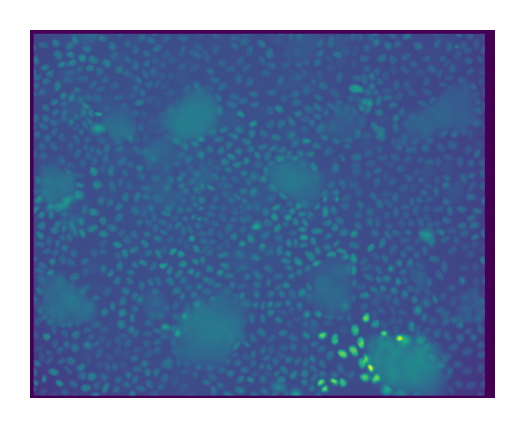

In [3]:
files = []
    
data_folder = '/home/nathan/data/kraken/h2b/giulia/GV0807/Pos3/Pos3_aligned'
# for channel in channelz:
#         files = glob.glob(os.path.join(data_folder,'img_channel00{}*.tif'.format(channel.value)))
## load just one channel
files = glob.glob(os.path.join(data_folder,'img_channel00{}*.tif'.format(1)))
files = natsorted(files)

# view 1 image
img = io.imread(files[-1])
plt.figure(figsize=(2,2))
plt.imshow(img)
plt.axis('off')
plt.show()

### Run cellpose on previously defined files 

In [7]:
# RUN CELLPOSE

from cellpose import models, io

# DEFINE CELLPOSE MODEL
# model_type='cyto' or model_type='nuclei'
model = models.Cellpose(gpu=False, model_type='nuclei')

# define CHANNELS to run segementa0tion on
# grayscale=0, R=1, G=2, B=3
# channels = [cytoplasm, nucleus]
# if NUCLEUS channel does not exist, set the second channel to 0
channels = [0,0]
# IF ALL YOUR IMAGES ARE THE SAME TYPE, you can give a list with 2 elements
# channels = [0,0] # IF YOU HAVE GRAYSCALE
# channels = [2,3] # IF YOU HAVE G=cytoplasm and B=nucleus
# channels = [2,1] # IF YOU HAVE G=cytoplasm and R=nucleus

# or if you have different types of channels in each image
#channels = [[2,3], [0,0], [0,0]]

# if diameter is set to None, the size of the cells is estimated on a per image basis
# you can set the average cell `diameter` in pixels yourself (recommended) 
# diameter can be a list or a single number for all images

# you can run all in a list e.g.
# imgs = [io.imread(filename) for filename in files]
# masks, flows, styles, diams = model.eval(imgs, diameter=50, channels=channels)
# io.masks_flows_to_seg(imgs, masks, flows, diams, files, channels)
# io.save_to_png(imgs, masks, flows, files)

# # or in a loop
#for chan, filename in zip(channels, files):
files = files[-2:-1]
for filename in tqdm(files):
    
    img = io.imread(filename)
    #masks, flows, styles, diams = model.eval(img, diameter=50, channels=chan)
    masks, flows, styles, diams = model.eval(img, diameter=150, channels=[0,0])

    # save results so you can load in gui
    #io.masks_flows_to_seg(img, masks, flows, diams, filename, chan)
    io.masks_flows_to_seg(img, masks, flows, diams, filename, [0,0])

    # save results as png
    #io.save_to_png(img, masks, flows, filename)

2021-07-09 13:53:53,955 [INFO] >>>> using CPU


0it [00:00, ?it/s]


### Show results of segmentation

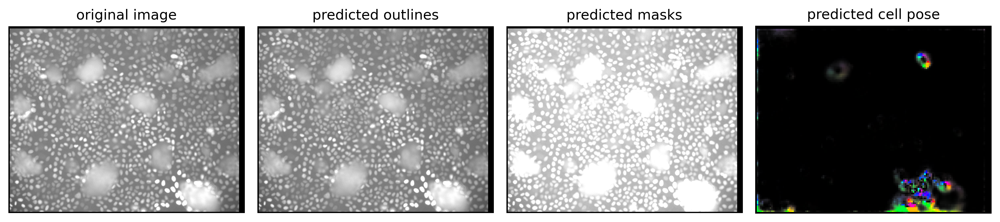

In [8]:
# DISPLAY RESULTS
from cellpose import plot

fig = plt.figure(figsize=(12,5))
plot.show_segmentation(fig, img, masks, flows[0], channels=[0,0])
plt.tight_layout()
plt.show()

### Show larger image of segmentation

(-0.5, 1738.5, 1376.5, -0.5)

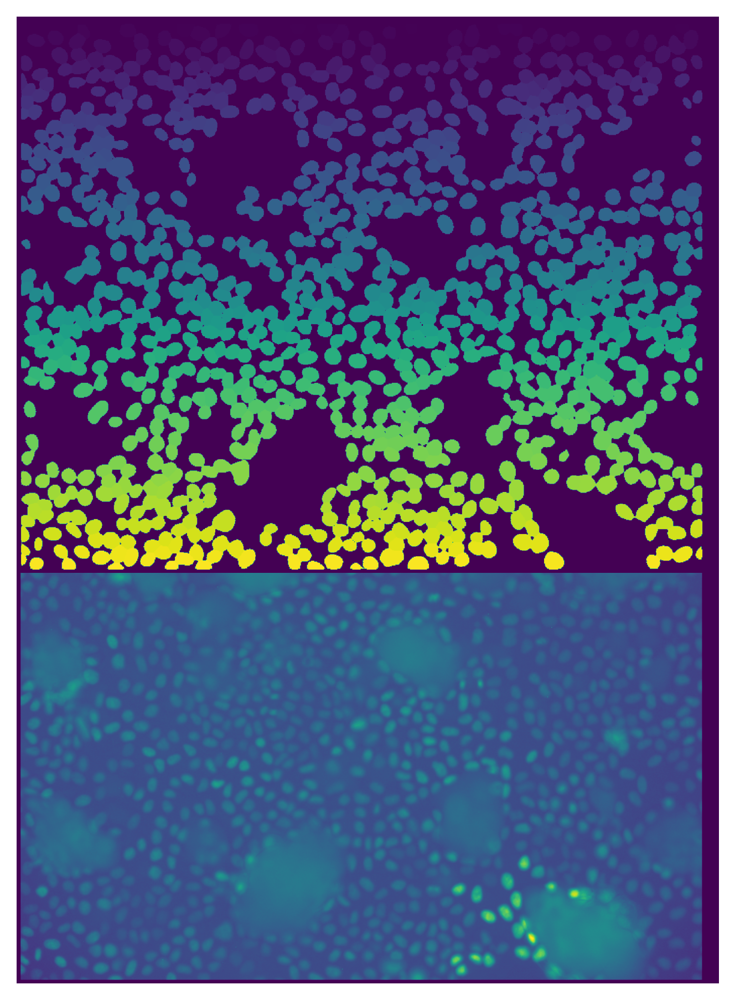

In [41]:
fig = plt.figure(figsize=(12,12))
ax1 = fig.add_subplot(1,2,2)
ax1.imshow(img)
plt.axis('off')
ax2 = fig.add_subplot(2,2,2)
ax2.imshow(masks)
plt.axis('off')

# Do all of the above

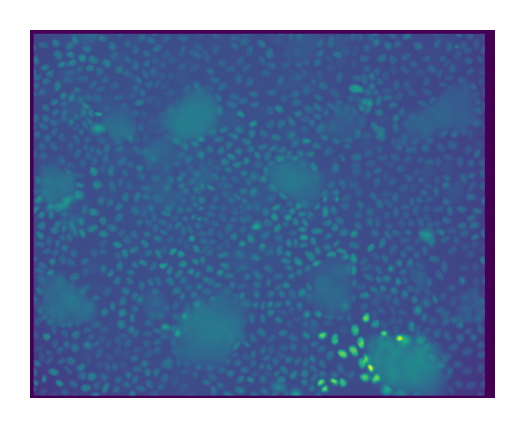

2021-07-09 14:38:27,390 [INFO] >>>> using CPU


  0%|          | 0/1 [00:00<?, ?it/s]

2021-07-09 14:38:27,461 [INFO] ~~~ ESTIMATING CELL DIAMETER(S) ~~~
2021-07-09 14:40:00,937 [INFO] estimated cell diameter(s) in 93.48 sec
2021-07-09 14:40:00,938 [INFO] >>> diameter(s) = 
2021-07-09 14:40:00,938 [INFO] [ 34.72 ]
2021-07-09 14:40:00,939 [INFO] ~~~ FINDING MASKS ~~~
2021-07-09 14:41:55,515 [INFO] >>>> TOTAL TIME 208.05 sec


100%|██████████| 1/1 [03:28<00:00, 208.48s/it]


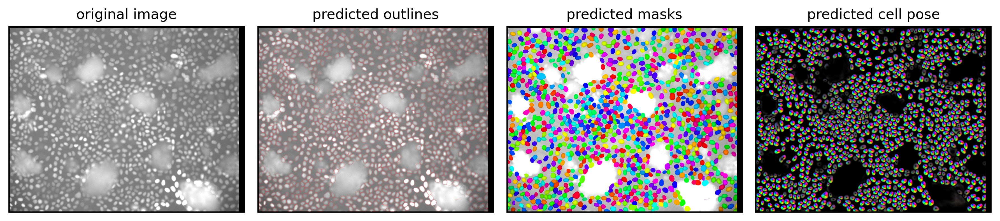

In [72]:
files = []
    
data_folder = '/home/nathan/data/kraken/h2b/giulia/GV0807/Pos3/Pos3_aligned'
# for channel in channelz:
#         files = glob.glob(os.path.join(data_folder,'img_channel00{}*.tif'.format(channel.value)))
## load just one channel
files = glob.glob(os.path.join(data_folder,'img_channel00{}*.tif'.format(1)))
files = natsorted(files)

# view 1 image
img = io.imread(files[-1])
plt.figure(figsize=(2,2))
plt.imshow(img)
plt.axis('off')
plt.show()

# RUN CELLPOSE

from cellpose import models, io

# DEFINE CELLPOSE MODEL
# model_type='cyto' or model_type='nuclei'
model = models.Cellpose(gpu=False, model_type='cyto')

# define CHANNELS to run segementa0tion on
# grayscale=0, R=1, G=2, B=3
# channels = [cytoplasm, nucleus]
# if NUCLEUS channel does not exist, set the second channel to 0
channels = [0,0]
# IF ALL YOUR IMAGES ARE THE SAME TYPE, you can give a list with 2 elements
# channels = [0,0] # IF YOU HAVE GRAYSCALE
# channels = [2,3] # IF YOU HAVE G=cytoplasm and B=nucleus
# channels = [2,1] # IF YOU HAVE G=cytoplasm and R=nucleus

# or if you have different types of channels in each image
#channels = [[2,3], [0,0], [0,0]]

# if diameter is set to None, the size of the cells is estimated on a per image basis
# you can set the average cell `diameter` in pixels yourself (recommended) 
# diameter can be a list or a single number for all images

# you can run all in a list e.g.
# imgs = [io.imread(filename) for filename in files]
# masks, flows, styles, diams = model.eval(imgs, diameter=50, channels=channels)
# io.masks_flows_to_seg(imgs, masks, flows, diams, files, channels)
# io.save_to_png(imgs, masks, flows, files)

# # or in a loop
#for chan, filename in zip(channels, files):
files = files[-2:-1]
for filename in tqdm(files):
    
    img = io.imread(filename)
    #masks, flows, styles, diams = model.eval(img, diameter=50, channels=chan)
    masks, flows, styles, diams = model.eval(img, diameter=None, channels=[0,0])

    # save results so you can load in gui
    #io.masks_flows_to_seg(img, masks, flows, diams, filename, chan)
    io.masks_flows_to_seg(img, masks, flows, diams, filename, [0,0])

    # save results as png
    #io.save_to_png(img, masks, flows, filename)
    
# DISPLAY RESULTS
from cellpose import plot

fig = plt.figure(figsize=(12,5))
plot.show_segmentation(fig, img, masks, flows[0], channels=[0,0])
plt.tight_layout()
plt.show()

(-0.5, 1738.5, 1376.5, -0.5)

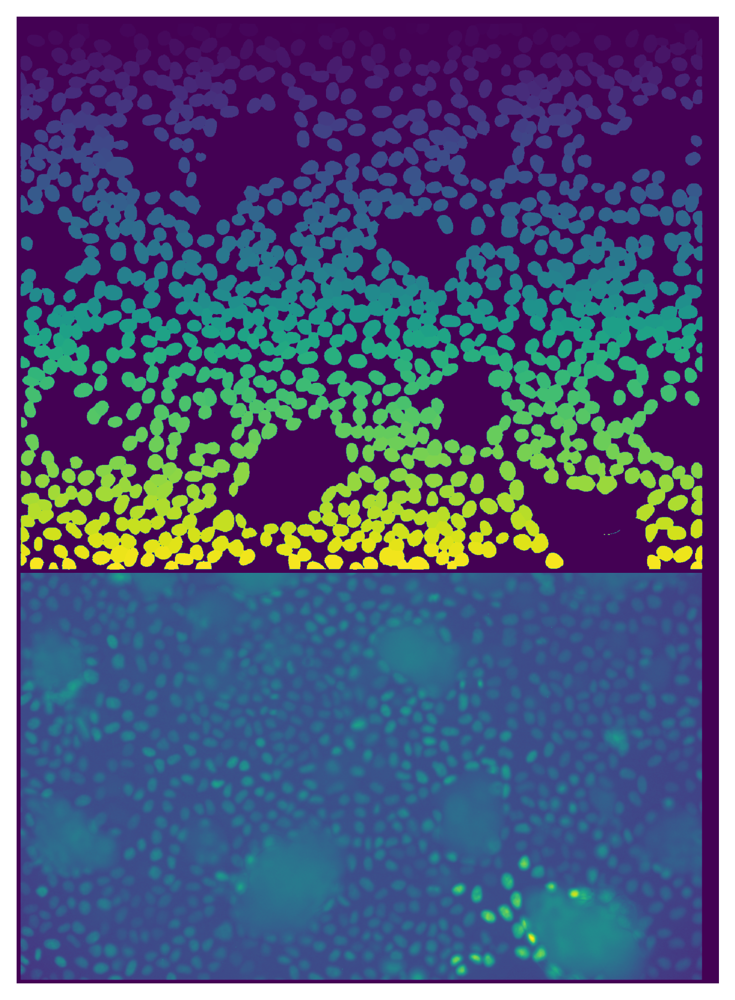

In [73]:
fig = plt.figure(figsize=(12,12))
ax1 = fig.add_subplot(1,2,2)
ax1.imshow(img)
plt.axis('off')
ax2 = fig.add_subplot(2,2,2)
ax2.imshow(masks)
plt.axis('off')

# subtract background cells from original image leaving only blisters and noise

In [110]:
from scipy import ndimage as ndi
from scipy.ndimage import gaussian_filter

binary_segmentation = np.zeros(masks.shape, dtype=bool)
weight_mask = np.zeros(img.shape, dtype=np.float32)
labels = list(np.unique(masks).astype(int))
labels.remove(0)
for i in labels:
    mask = masks == i
    #mask_eroded = ndi.binary_erosion(mask, iterations=1)
    mask_dilated = ndi.binary_dilation(mask, iterations = 10)    
    ## fill individual mask with gaussian noise
    binary_segmentation = np.logical_or(binary_segmentation, mask_dilated)
    
    ### weightmap technique
    #cell = labelled == i
    not_cell = np.logical_xor(mask, img) #np.logical_and(labelled != i, labelled > 0)
    image_diff = gaussian_filter(mask.astype(np.float32), sigma=10) * gaussian_filter(not_cell.astype(np.float32), sigma=10)
    weight_mask += image_diff
    
mean = np.mean(img)   # some constant
std = np.std(img)    # some constant (standard deviation)
noisy_img = np.zeros(img.shape) + np.random.normal(mean, std, img.shape)
noisy_img_clipped = np.clip(noisy_img, 0, 255)  # we might get out of bounds due to noise

blisters_only = np.invert(binary_segmentation)*img
noisy_masks = noisy_img_clipped * binary_segmentation
blister_img = noisy_masks+blisters_only

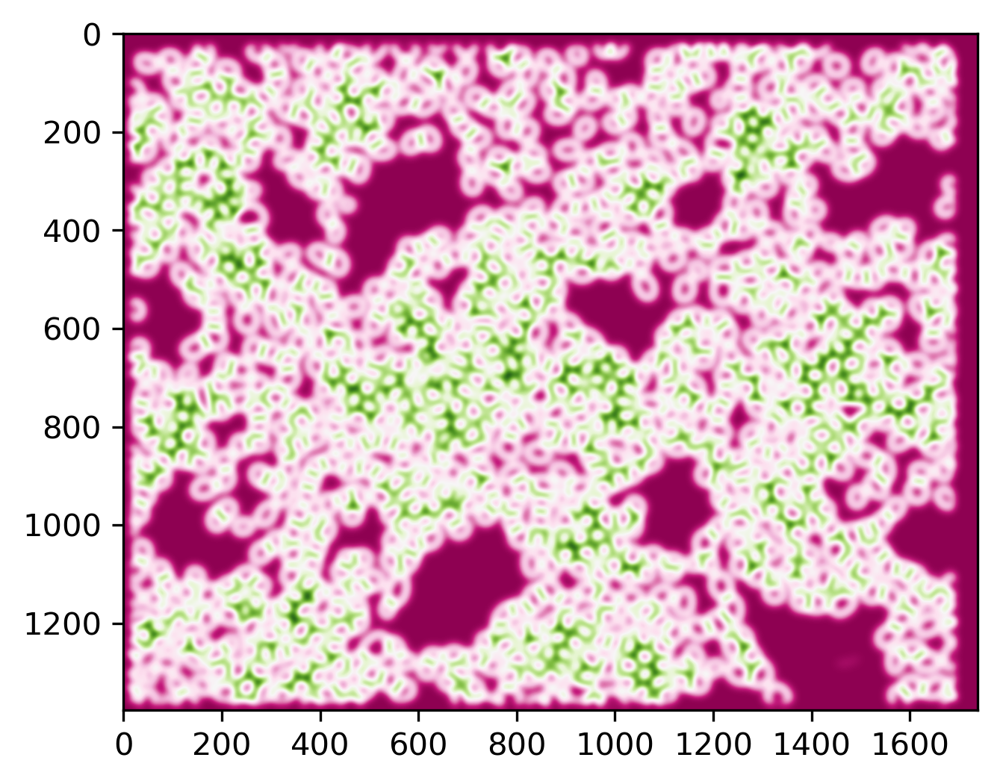

In [111]:
plt.imshow(weight_mask, cmap = 'PiYG')

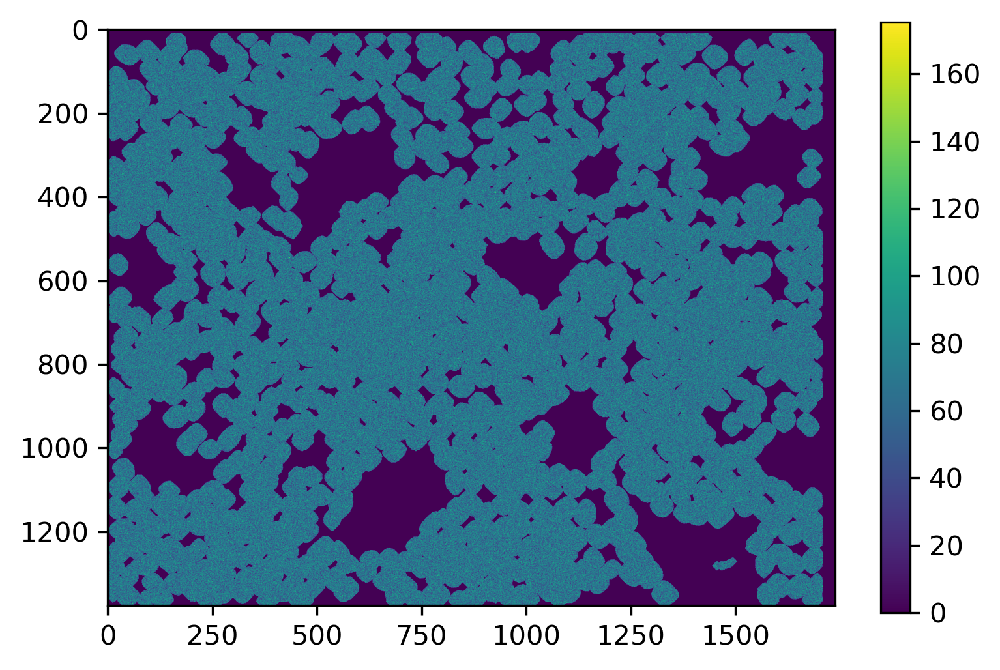

In [104]:
plt.imshow(gaussian_filter(noisy_masks, sigma=0))
#plt.axis('off')
plt.colorbar()
plt.show()

2021-07-09 14:55:30,214 [INFO] >>>> using CPU


  0%|          | 0/1 [00:00<?, ?it/s]

2021-07-09 14:55:30,302 [INFO] ~~~ ESTIMATING CELL DIAMETER(S) ~~~
2021-07-09 14:57:03,958 [INFO] estimated cell diameter(s) in 93.66 sec
2021-07-09 14:57:03,959 [INFO] >>> diameter(s) = 
2021-07-09 14:57:03,960 [INFO] [ 34.72 ]
2021-07-09 14:57:03,960 [INFO] ~~~ FINDING MASKS ~~~
2021-07-09 14:59:08,267 [INFO] >>>> TOTAL TIME 217.97 sec


100%|██████████| 1/1 [03:38<00:00, 218.49s/it]


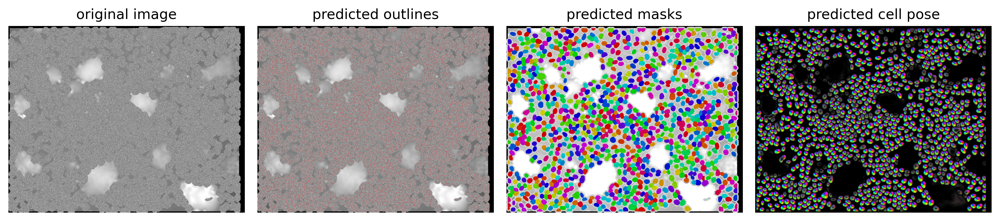

In [79]:
# RUN CELLPOSE

from cellpose import models, io

# DEFINE CELLPOSE MODEL
# model_type='cyto' or model_type='nuclei'
model = models.Cellpose(gpu=False, model_type='cyto')

# define CHANNELS to run segementa0tion on
# grayscale=0, R=1, G=2, B=3
# channels = [cytoplasm, nucleus]
# if NUCLEUS channel does not exist, set the second channel to 0
channels = [0,0]
# IF ALL YOUR IMAGES ARE THE SAME TYPE, you can give a list with 2 elements
# channels = [0,0] # IF YOU HAVE GRAYSCALE
# channels = [2,3] # IF YOU HAVE G=cytoplasm and B=nucleus
# channels = [2,1] # IF YOU HAVE G=cytoplasm and R=nucleus

# or if you have different types of channels in each image
#channels = [[2,3], [0,0], [0,0]]

# if diameter is set to None, the size of the cells is estimated on a per image basis
# you can set the average cell `diameter` in pixels yourself (recommended) 
# diameter can be a list or a single number for all images

# you can run all in a list e.g.
# imgs = [io.imread(filename) for filename in files]
# masks, flows, styles, diams = model.eval(imgs, diameter=50, channels=channels)
# io.masks_flows_to_seg(imgs, masks, flows, diams, files, channels)
# io.save_to_png(imgs, masks, flows, files)

# # or in a loop
#for chan, filename in zip(channels, files):
#files = files[-2:-1]
for filename in tqdm(files):
    
    #img = blister_img
    #masks, flows, styles, diams = model.eval(img, diameter=50, channels=chan)
    blister_masks, flows, styles, diams = model.eval(img, diameter=None, channels=[0,0])

    # save results so you can load in gui
    #io.masks_flows_to_seg(img, masks, flows, diams, filename, chan)
    io.masks_flows_to_seg(blister_img, blister_masks, flows, diams, filename, [0,0])

    # save results as png
    #io.save_to_png(img, masks, flows, filename)
    
# DISPLAY RESULTS
from cellpose import plot

fig = plt.figure(figsize=(12,5))
plot.show_segmentation(fig, blister_img, blister_masks, flows[0], channels=[0,0])
plt.tight_layout()
plt.show()

# Bulk run segmentation job

Many positions, many channel, many frame

### Define channels and positions to be segmented

In [63]:
@enum.unique
class channelz(enum.Enum):
    #bf = 0 
    gfp = 1
    rfp = 2
    #irfp = 3
pos_list = range(0,5)
for pos in pos_list:
    print(pos)

0
1
2
3
4


In [ ]:
error_log = []
for pos in tqdm(pos_list):
    data_folder = '/run/user/1000/gvfs/smb-share:server=lowe-sn00.biochem.ucl.ac.uk,share=lowegrp/Data/Manasi/MK0000/Pos{}'.format(pos)
    files = []
    for channel in tqdm(channelz):
            files = natsorted(glob.glob(os.path.join(data_folder,'img_channel00{}*.tif'.format(channel.value))))

    # RUN CELLPOSE

            from cellpose import models, io

            # DEFINE CELLPOSE MODEL
            # model_type='cyto' or model_type='nuclei'
            model = models.Cellpose(gpu=False, model_type='cyto')

            # define CHANNELS to run segementa0tion on
            # grayscale=0, R=1, G=2, B=3
            # channels = [cytoplasm, nucleus]
            # if NUCLEUS channel does not exist, set the second channel to 0
            channels = [0,0]
            # IF ALL YOUR IMAGES ARE THE SAME TYPE, you can give a list with 2 elements
            # channels = [0,0] # IF YOU HAVE GRAYSCALE
            # channels = [2,3] # IF YOU HAVE G=cytoplasm and B=nucleus
            # channels = [2,1] # IF YOU HAVE G=cytoplasm and R=nucleus

            # or if you have different types of channels in each image
            #channels = [[2,3], [0,0], [0,0]]

            # if diameter is set to None, the size of the cells is estimated on a per image basis
            # you can set the average cell `diameter` in pixels yourself (recommended) 
            # diameter can be a list or a single number for all images

            # you can run all in a list e.g.
            # imgs = [io.imread(filename) for filename in files]
            # masks, flows, styles, diams = model.eval(imgs, diameter=50, channels=channels)
            # io.masks_flows_to_seg(imgs, masks, flows, diams, files, channels)
            # io.save_to_png(imgs, masks, flows, files)

            # # or in a loop
            #for chan, filename in zip(channels, files):
            for filename in tqdm(files):
                try:
                    img = io.imread(filename)
                    #masks, flows, styles, diams = model.eval(img, diameter=50, channels=chan)
                    masks, flows, styles, diams = model.eval(img, diameter=50, channels=[0,0])

                    # save results so you can load in gui
                    #io.masks_flows_to_seg(img, masks, flows, diams, filename, chan)
                    #### DO NOT NEED THE FOLLOWING LINE
                    io.masks_flows_to_seg(img, masks, flows, diams, filename, [0,0])

                    # save results as png
                    io.save_to_png(img, masks, 0, filename)
                except:
                    error_message = filename + 'failed to process'
                    error_log.append(error_message)

  0%|          | 0/2 [00:00<?, ?it/s]

2021-05-17 13:39:43,955 [INFO] >>>> using CPU




  0%|          | 0/1015 [00:00<?, ?it/s]

2021-05-17 13:39:44,237 [INFO] ~~~ FINDING MASKS ~~~
2021-05-17 13:40:44,769 [INFO] >>>> TOTAL TIME 60.53 sec




  0%|          | 1/1015 [01:12<20:27:15, 72.62s/it]

2021-05-17 13:40:56,891 [INFO] ~~~ FINDING MASKS ~~~
2021-05-17 13:41:55,495 [INFO] >>>> TOTAL TIME 58.60 sec




  0%|          | 2/1015 [02:29<21:05:44, 74.97s/it]

2021-05-17 13:42:13,520 [INFO] ~~~ FINDING MASKS ~~~
2021-05-17 13:43:12,638 [INFO] >>>> TOTAL TIME 59.12 sec




  0%|          | 3/1015 [03:29<19:12:46, 68.35s/it]

2021-05-17 13:43:13,894 [INFO] ~~~ FINDING MASKS ~~~
2021-05-17 13:44:08,914 [INFO] >>>> TOTAL TIME 55.02 sec




  0%|          | 4/1015 [04:25<17:50:40, 63.54s/it]

2021-05-17 13:44:10,065 [INFO] ~~~ FINDING MASKS ~~~
2021-05-17 13:45:08,423 [INFO] >>>> TOTAL TIME 58.36 sec




  0%|          | 5/1015 [05:25<17:24:30, 62.05s/it]

2021-05-17 13:45:09,581 [INFO] ~~~ FINDING MASKS ~~~
2021-05-17 13:46:07,308 [INFO] >>>> TOTAL TIME 57.73 sec




  1%|          | 6/1015 [06:24<17:05:27, 60.98s/it]

2021-05-17 13:46:08,540 [INFO] ~~~ FINDING MASKS ~~~
2021-05-17 13:47:06,394 [INFO] >>>> TOTAL TIME 57.85 sec




  1%|          | 7/1015 [07:23<16:54:16, 60.37s/it]

2021-05-17 13:47:07,492 [INFO] ~~~ FINDING MASKS ~~~
2021-05-17 13:48:07,189 [INFO] >>>> TOTAL TIME 59.70 sec




  1%|          | 8/1015 [08:24<16:55:50, 60.53s/it]

2021-05-17 13:48:08,359 [INFO] ~~~ FINDING MASKS ~~~
2021-05-17 13:49:07,517 [INFO] >>>> TOTAL TIME 59.16 sec




  1%|          | 9/1015 [09:24<16:53:53, 60.47s/it]

2021-05-17 13:49:08,773 [INFO] ~~~ FINDING MASKS ~~~
2021-05-17 13:50:08,223 [INFO] >>>> TOTAL TIME 59.45 sec




  1%|          | 10/1015 [10:25<16:54:15, 60.55s/it]

2021-05-17 13:50:09,548 [INFO] ~~~ FINDING MASKS ~~~
2021-05-17 13:51:12,133 [INFO] >>>> TOTAL TIME 62.58 sec




  1%|          | 11/1015 [11:29<17:12:16, 61.69s/it]

2021-05-17 13:51:13,738 [INFO] ~~~ FINDING MASKS ~~~
2021-05-17 13:52:17,102 [INFO] >>>> TOTAL TIME 63.36 sec




  1%|          | 12/1015 [12:34<17:25:31, 62.54s/it]

2021-05-17 13:52:18,199 [INFO] ~~~ FINDING MASKS ~~~
2021-05-17 13:53:16,948 [INFO] >>>> TOTAL TIME 58.75 sec




  1%|▏         | 13/1015 [13:33<17:11:32, 61.77s/it]

2021-05-17 13:53:18,186 [INFO] ~~~ FINDING MASKS ~~~
2021-05-17 13:54:15,967 [INFO] >>>> TOTAL TIME 57.78 sec




  1%|▏         | 14/1015 [14:32<16:55:53, 60.89s/it]

2021-05-17 13:54:17,101 [INFO] ~~~ FINDING MASKS ~~~
2021-05-17 13:55:18,892 [INFO] >>>> TOTAL TIME 61.79 sec




  1%|▏         | 15/1015 [15:35<17:05:38, 61.54s/it]

2021-05-17 13:55:20,221 [INFO] ~~~ FINDING MASKS ~~~
2021-05-17 13:56:19,421 [INFO] >>>> TOTAL TIME 59.20 sec




  2%|▏         | 16/1015 [16:36<16:58:50, 61.19s/it]

2021-05-17 13:56:20,469 [INFO] ~~~ FINDING MASKS ~~~
2021-05-17 13:57:21,537 [INFO] >>>> TOTAL TIME 61.07 sec




  2%|▏         | 17/1015 [17:38<17:04:49, 61.61s/it]

2021-05-17 13:57:23,087 [INFO] ~~~ FINDING MASKS ~~~
2021-05-17 13:58:21,109 [INFO] >>>> TOTAL TIME 58.02 sec




  2%|▏         | 18/1015 [18:37<16:51:19, 60.86s/it]

2021-05-17 13:58:22,178 [INFO] ~~~ FINDING MASKS ~~~
2021-05-17 13:59:21,325 [INFO] >>>> TOTAL TIME 59.15 sec




  2%|▏         | 19/1015 [19:38<16:47:29, 60.69s/it]

2021-05-17 13:59:22,639 [INFO] ~~~ FINDING MASKS ~~~
2021-05-17 14:00:25,328 [INFO] >>>> TOTAL TIME 62.69 sec




  2%|▏         | 20/1015 [20:42<17:02:53, 61.68s/it]

2021-05-17 14:00:26,527 [INFO] ~~~ FINDING MASKS ~~~
2021-05-17 14:01:29,925 [INFO] >>>> TOTAL TIME 63.40 sec




  2%|▏         | 21/1015 [21:46<17:16:24, 62.56s/it]

2021-05-17 14:01:31,130 [INFO] ~~~ FINDING MASKS ~~~
2021-05-17 14:02:34,364 [INFO] >>>> TOTAL TIME 63.23 sec




  2%|▏         | 22/1015 [22:51<17:24:51, 63.13s/it]

2021-05-17 14:02:35,602 [INFO] ~~~ FINDING MASKS ~~~
2021-05-17 14:03:35,002 [INFO] >>>> TOTAL TIME 59.40 sec




  2%|▏         | 23/1015 [23:52<17:11:30, 62.39s/it]

2021-05-17 14:03:36,213 [INFO] ~~~ FINDING MASKS ~~~
2021-05-17 14:04:39,053 [INFO] >>>> TOTAL TIME 62.84 sec




  2%|▏         | 24/1015 [24:56<17:18:46, 62.89s/it]

2021-05-17 14:04:40,280 [INFO] ~~~ FINDING MASKS ~~~
2021-05-17 14:05:41,562 [INFO] >>>> TOTAL TIME 61.28 sec




  2%|▏         | 25/1015 [25:58<17:15:45, 62.77s/it]

2021-05-17 14:05:42,781 [INFO] ~~~ FINDING MASKS ~~~
2021-05-17 14:06:44,649 [INFO] >>>> TOTAL TIME 61.87 sec




  3%|▎         | 26/1015 [27:01<17:15:58, 62.85s/it]

2021-05-17 14:06:45,780 [INFO] ~~~ FINDING MASKS ~~~
2021-05-17 14:07:45,486 [INFO] >>>> TOTAL TIME 59.71 sec




  3%|▎         | 27/1015 [28:02<17:05:24, 62.27s/it]

2021-05-17 14:07:46,789 [INFO] ~~~ FINDING MASKS ~~~
2021-05-17 14:08:46,888 [INFO] >>>> TOTAL TIME 60.10 sec




  3%|▎         | 28/1015 [29:03<16:59:29, 61.97s/it]

2021-05-17 14:08:48,009 [INFO] ~~~ FINDING MASKS ~~~
2021-05-17 14:09:50,702 [INFO] >>>> TOTAL TIME 62.69 sec




  3%|▎         | 29/1015 [30:07<17:07:21, 62.52s/it]

2021-05-17 14:09:51,762 [INFO] ~~~ FINDING MASKS ~~~
2021-05-17 14:10:51,919 [INFO] >>>> TOTAL TIME 60.16 sec




  3%|▎         | 30/1015 [31:08<17:00:16, 62.15s/it]

2021-05-17 14:10:53,091 [INFO] ~~~ FINDING MASKS ~~~
2021-05-17 14:11:54,148 [INFO] >>>> TOTAL TIME 61.06 sec




  3%|▎         | 31/1015 [32:11<17:03:21, 62.40s/it]

2021-05-17 14:11:56,060 [INFO] ~~~ FINDING MASKS ~~~
2021-05-17 14:12:57,494 [INFO] >>>> TOTAL TIME 61.43 sec




  3%|▎         | 32/1015 [33:14<17:03:08, 62.45s/it]

2021-05-17 14:12:58,687 [INFO] ~~~ FINDING MASKS ~~~
2021-05-17 14:13:59,594 [INFO] >>>> TOTAL TIME 60.91 sec




  3%|▎         | 33/1015 [34:16<17:00:42, 62.36s/it]

2021-05-17 14:14:00,800 [INFO] ~~~ FINDING MASKS ~~~
2021-05-17 14:14:58,853 [INFO] >>>> TOTAL TIME 58.05 sec




  3%|▎         | 34/1015 [35:15<16:44:43, 61.45s/it]

2021-05-17 14:15:00,145 [INFO] ~~~ FINDING MASKS ~~~
2021-05-17 14:16:01,349 [INFO] >>>> TOTAL TIME 61.20 sec




  3%|▎         | 35/1015 [36:18<16:48:06, 61.72s/it]

2021-05-17 14:16:02,449 [INFO] ~~~ FINDING MASKS ~~~
2021-05-17 14:17:05,379 [INFO] >>>> TOTAL TIME 62.93 sec




  4%|▎         | 36/1015 [37:22<16:58:40, 62.43s/it]

2021-05-17 14:17:06,569 [INFO] ~~~ FINDING MASKS ~~~
2021-05-17 14:18:09,595 [INFO] >>>> TOTAL TIME 63.03 sec




  4%|▎         | 37/1015 [38:26<17:06:32, 62.98s/it]

2021-05-17 14:18:10,834 [INFO] ~~~ FINDING MASKS ~~~
2021-05-17 14:19:11,104 [INFO] >>>> TOTAL TIME 60.27 sec




  4%|▎         | 38/1015 [39:28<16:57:51, 62.51s/it]

2021-05-17 14:19:12,256 [INFO] ~~~ FINDING MASKS ~~~
2021-05-17 14:20:12,568 [INFO] >>>> TOTAL TIME 60.31 sec




  4%|▍         | 39/1015 [40:29<16:52:20, 62.23s/it]

2021-05-17 14:20:13,827 [INFO] ~~~ FINDING MASKS ~~~
2021-05-17 14:21:13,918 [INFO] >>>> TOTAL TIME 60.09 sec




  4%|▍         | 40/1015 [41:30<16:46:37, 61.95s/it]

2021-05-17 14:21:15,099 [INFO] ~~~ FINDING MASKS ~~~
2021-05-17 14:22:14,915 [INFO] >>>> TOTAL TIME 59.82 sec




  4%|▍         | 41/1015 [42:31<16:40:52, 61.66s/it]

2021-05-17 14:22:16,104 [INFO] ~~~ FINDING MASKS ~~~
2021-05-17 14:23:20,318 [INFO] >>>> TOTAL TIME 64.21 sec




  4%|▍         | 42/1015 [43:37<16:57:58, 62.77s/it]

2021-05-17 14:23:21,471 [INFO] ~~~ FINDING MASKS ~~~
2021-05-17 14:24:26,007 [INFO] >>>> TOTAL TIME 64.54 sec




  4%|▍         | 43/1015 [44:42<17:10:57, 63.64s/it]

2021-05-17 14:24:27,144 [INFO] ~~~ FINDING MASKS ~~~
2021-05-17 14:25:32,889 [INFO] >>>> TOTAL TIME 65.75 sec




  4%|▍         | 44/1015 [45:49<17:26:02, 64.64s/it]

2021-05-17 14:25:34,057 [INFO] ~~~ FINDING MASKS ~~~
2021-05-17 14:26:41,402 [INFO] >>>> TOTAL TIME 67.35 sec




  4%|▍         | 45/1015 [46:58<17:43:26, 65.78s/it]

2021-05-17 14:26:42,524 [INFO] ~~~ FINDING MASKS ~~~
2021-05-17 14:27:46,549 [INFO] >>>> TOTAL TIME 64.03 sec




  5%|▍         | 46/1015 [48:03<17:40:24, 65.66s/it]

2021-05-17 14:27:47,895 [INFO] ~~~ FINDING MASKS ~~~
2021-05-17 14:28:51,624 [INFO] >>>> TOTAL TIME 63.73 sec




  5%|▍         | 47/1015 [49:09<17:37:44, 65.56s/it]

2021-05-17 14:28:53,237 [INFO] ~~~ FINDING MASKS ~~~
2021-05-17 14:29:57,696 [INFO] >>>> TOTAL TIME 64.46 sec




  5%|▍         | 48/1015 [50:14<17:36:19, 65.54s/it]

2021-05-17 14:29:58,723 [INFO] ~~~ FINDING MASKS ~~~
2021-05-17 14:31:02,843 [INFO] >>>> TOTAL TIME 64.12 sec




  5%|▍         | 49/1015 [51:19<17:33:59, 65.47s/it]

2021-05-17 14:31:04,132 [INFO] ~~~ FINDING MASKS ~~~
2021-05-17 14:32:11,772 [INFO] >>>> TOTAL TIME 67.64 sec




  5%|▍         | 50/1015 [52:28<17:49:33, 66.50s/it]

2021-05-17 14:32:12,917 [INFO] ~~~ FINDING MASKS ~~~
2021-05-17 14:33:17,396 [INFO] >>>> TOTAL TIME 64.48 sec




  5%|▌         | 51/1015 [53:34<17:44:30, 66.26s/it]

2021-05-17 14:33:18,613 [INFO] ~~~ FINDING MASKS ~~~
2021-05-17 14:34:24,282 [INFO] >>>> TOTAL TIME 65.67 sec




  5%|▌         | 52/1015 [54:41<17:46:14, 66.43s/it]

2021-05-17 14:34:25,452 [INFO] ~~~ FINDING MASKS ~~~
2021-05-17 14:35:32,425 [INFO] >>>> TOTAL TIME 66.97 sec




  5%|▌         | 53/1015 [55:49<17:53:09, 66.93s/it]

2021-05-17 14:35:33,601 [INFO] ~~~ FINDING MASKS ~~~
2021-05-17 14:36:39,357 [INFO] >>>> TOTAL TIME 65.76 sec




  5%|▌         | 54/1015 [56:56<17:52:11, 66.94s/it]

2021-05-17 14:36:40,511 [INFO] ~~~ FINDING MASKS ~~~
2021-05-17 14:37:48,853 [INFO] >>>> TOTAL TIME 68.34 sec




  5%|▌         | 55/1015 [58:05<18:03:21, 67.71s/it]

2021-05-17 14:37:50,013 [INFO] ~~~ FINDING MASKS ~~~
2021-05-17 14:38:55,753 [INFO] >>>> TOTAL TIME 65.74 sec




  6%|▌         | 56/1015 [59:12<17:57:52, 67.44s/it]

2021-05-17 14:38:56,811 [INFO] ~~~ FINDING MASKS ~~~
2021-05-17 14:39:59,496 [INFO] >>>> TOTAL TIME 62.68 sec




  6%|▌         | 57/1015 [1:00:16<17:39:38, 66.37s/it]

2021-05-17 14:40:00,712 [INFO] ~~~ FINDING MASKS ~~~
2021-05-17 14:41:09,929 [INFO] >>>> TOTAL TIME 69.22 sec




  6%|▌         | 58/1015 [1:01:27<17:58:36, 67.62s/it]

2021-05-17 14:41:11,251 [INFO] ~~~ FINDING MASKS ~~~
2021-05-17 14:42:17,154 [INFO] >>>> TOTAL TIME 65.90 sec




  6%|▌         | 59/1015 [1:02:34<17:57:29, 67.62s/it]

2021-05-17 14:42:18,956 [INFO] ~~~ FINDING MASKS ~~~
2021-05-17 14:43:31,862 [INFO] >>>> TOTAL TIME 72.91 sec




  6%|▌         | 60/1015 [1:03:48<18:27:02, 69.55s/it]

2021-05-17 14:43:32,902 [INFO] ~~~ FINDING MASKS ~~~
2021-05-17 14:44:39,796 [INFO] >>>> TOTAL TIME 66.89 sec




  6%|▌         | 61/1015 [1:04:56<18:18:20, 69.08s/it]

2021-05-17 14:44:40,897 [INFO] ~~~ FINDING MASKS ~~~
2021-05-17 14:45:56,697 [INFO] >>>> TOTAL TIME 75.80 sec




  6%|▌         | 62/1015 [1:06:13<18:54:29, 71.43s/it]

2021-05-17 14:45:57,785 [INFO] ~~~ FINDING MASKS ~~~
2021-05-17 14:47:05,570 [INFO] >>>> TOTAL TIME 67.79 sec




  6%|▌         | 63/1015 [1:07:22<18:41:16, 70.67s/it]

2021-05-17 14:47:06,697 [INFO] ~~~ FINDING MASKS ~~~
2021-05-17 14:48:18,134 [INFO] >>>> TOTAL TIME 71.44 sec




  6%|▋         | 64/1015 [1:08:35<18:49:12, 71.24s/it]

2021-05-17 14:48:19,447 [INFO] ~~~ FINDING MASKS ~~~
2021-05-17 14:49:26,041 [INFO] >>>> TOTAL TIME 66.59 sec




  6%|▋         | 65/1015 [1:09:42<18:32:05, 70.24s/it]

2021-05-17 14:49:27,178 [INFO] ~~~ FINDING MASKS ~~~
2021-05-17 14:50:30,812 [INFO] >>>> TOTAL TIME 63.63 sec




  7%|▋         | 66/1015 [1:10:47<18:04:22, 68.56s/it]

2021-05-17 14:50:31,808 [INFO] ~~~ FINDING MASKS ~~~
2021-05-17 14:51:36,725 [INFO] >>>> TOTAL TIME 64.92 sec




  7%|▋         | 67/1015 [1:11:53<17:51:07, 67.79s/it]

2021-05-17 14:51:37,811 [INFO] ~~~ FINDING MASKS ~~~
2021-05-17 14:52:43,935 [INFO] >>>> TOTAL TIME 66.12 sec




  7%|▋         | 68/1015 [1:13:00<17:47:25, 67.63s/it]

2021-05-17 14:52:45,076 [INFO] ~~~ FINDING MASKS ~~~
2021-05-17 14:53:48,809 [INFO] >>>> TOTAL TIME 63.73 sec




  7%|▋         | 69/1015 [1:14:05<17:32:51, 66.78s/it]

2021-05-17 14:53:49,871 [INFO] ~~~ FINDING MASKS ~~~
2021-05-17 14:54:54,157 [INFO] >>>> TOTAL TIME 64.29 sec




  7%|▋         | 70/1015 [1:15:11<17:25:11, 66.36s/it]

2021-05-17 14:54:55,238 [INFO] ~~~ FINDING MASKS ~~~
2021-05-17 14:55:58,091 [INFO] >>>> TOTAL TIME 62.85 sec




  7%|▋         | 71/1015 [1:16:15<17:12:57, 65.65s/it]

2021-05-17 14:55:59,287 [INFO] ~~~ FINDING MASKS ~~~
2021-05-17 14:57:03,923 [INFO] >>>> TOTAL TIME 64.64 sec




  7%|▋         | 72/1015 [1:17:20<17:12:12, 65.68s/it]

2021-05-17 14:57:04,990 [INFO] ~~~ FINDING MASKS ~~~
2021-05-17 14:58:08,602 [INFO] >>>> TOTAL TIME 63.61 sec




  7%|▋         | 73/1015 [1:18:25<17:06:34, 65.39s/it]

2021-05-17 14:58:09,694 [INFO] ~~~ FINDING MASKS ~~~
2021-05-17 14:59:12,518 [INFO] >>>> TOTAL TIME 62.82 sec




  7%|▋         | 74/1015 [1:19:29<16:58:49, 64.96s/it]

2021-05-17 14:59:13,666 [INFO] ~~~ FINDING MASKS ~~~
2021-05-17 15:00:18,605 [INFO] >>>> TOTAL TIME 64.94 sec




  7%|▋         | 75/1015 [1:20:35<17:02:59, 65.30s/it]

2021-05-17 15:00:19,793 [INFO] ~~~ FINDING MASKS ~~~
2021-05-17 15:01:28,658 [INFO] >>>> TOTAL TIME 68.86 sec




  7%|▋         | 76/1015 [1:21:45<17:25:43, 66.82s/it]

2021-05-17 15:01:30,155 [INFO] ~~~ FINDING MASKS ~~~
2021-05-17 15:02:40,361 [INFO] >>>> TOTAL TIME 70.21 sec




  8%|▊         | 77/1015 [1:22:57<17:45:56, 68.18s/it]

2021-05-17 15:02:41,479 [INFO] ~~~ FINDING MASKS ~~~
2021-05-17 15:03:41,740 [INFO] >>>> TOTAL TIME 60.26 sec




  8%|▊         | 78/1015 [1:23:58<17:13:12, 66.16s/it]

2021-05-17 15:03:42,936 [INFO] ~~~ FINDING MASKS ~~~
2021-05-17 15:04:50,588 [INFO] >>>> TOTAL TIME 67.65 sec




  8%|▊         | 79/1015 [1:25:07<17:26:24, 67.08s/it]

2021-05-17 15:04:52,154 [INFO] ~~~ FINDING MASKS ~~~


/home/nathan/anaconda3/lib/python3.7/site-packages/cellpose/transforms.py:192: RuntimeWarning: divide by zero encountered in true_divide
  X = (X - x01) / (x99 - x01)
/home/nathan/anaconda3/lib/python3.7/site-packages/cellpose/transforms.py:192: RuntimeWarning: invalid value encountered in true_divide
  X = (X - x01) / (x99 - x01)


In [66]:
filename

'/run/user/1000/gvfs/smb-share:server=lowe-sn00.biochem.ucl.ac.uk,share=lowegrp/Data/Manasi/MK0000/Pos0/img_channel001_position000_time000001014_z000.tif'

# Reorganise output into separate folders

In [2]:
root_folder = '/run/user/1000/gvfs/smb-share:server=lowe-sn00.biochem.ucl.ac.uk,share=lowegrp/Data/Manasi/MK0000'

In [3]:
pos_list = natsorted([pos for pos in os.listdir(root_folder) if 'Pos' in pos])
pos_list

['Pos0',
 'Pos1',
 'Pos2',
 'Pos3',
 'Pos4',
 'Pos5',
 'Pos6',
 'Pos7',
 'Pos8',
 'Pos9',
 'Pos10',
 'Pos11',
 'Pos12',
 'Pos13',
 'Pos14',
 'Pos15',
 'Pos16',
 'Pos17',
 'Pos18',
 'Pos19',
 'Pos20',
 'Pos21',
 'Pos22',
 'Pos23']

# reorganise raw files into new raw directory

## dont do this until current seg job is complete!!

In [7]:
for pos in tqdm(pos_list):
    pos_folder = os.path.join(root_folder, pos)
    raw_image_files = natsorted([fn for fn in os.listdir(pos_folder) if '.tif' in fn])
    ### new raw image file directory
    output_raw_image_dir = os.path.join(pos_folder, pos + '_raw')
    try:
        os.mkdir(output_raw_image_dir)
    except:
        print(output_raw_image_dir, 'already created')
    for filename in raw_image_files:
        origin_raw_im_path = os.path.join(pos_folder, filename)
        output_raw_im_path = os.path.join(output_raw_image_dir, filename)
        os.rename(origin_raw_im_path, output_raw_im_path)


  0%|          | 0/24 [00:00<?, ?it/s]

/run/user/1000/gvfs/smb-share:server=lowe-sn00.biochem.ucl.ac.uk,share=lowegrp/Data/Manasi/MK0000/Pos0/Pos0_raw already created


  4%|▍         | 1/24 [01:14<28:23, 74.06s/it]

/run/user/1000/gvfs/smb-share:server=lowe-sn00.biochem.ucl.ac.uk,share=lowegrp/Data/Manasi/MK0000/Pos1/Pos1_raw already created


  8%|▊         | 2/24 [02:17<24:48, 67.65s/it]

/run/user/1000/gvfs/smb-share:server=lowe-sn00.biochem.ucl.ac.uk,share=lowegrp/Data/Manasi/MK0000/Pos2/Pos2_raw already created


 12%|█▎        | 3/24 [03:23<23:27, 67.04s/it]

/run/user/1000/gvfs/smb-share:server=lowe-sn00.biochem.ucl.ac.uk,share=lowegrp/Data/Manasi/MK0000/Pos3/Pos3_raw already created


 17%|█▋        | 4/24 [04:28<22:07, 66.37s/it]

/run/user/1000/gvfs/smb-share:server=lowe-sn00.biochem.ucl.ac.uk,share=lowegrp/Data/Manasi/MK0000/Pos4/Pos4_raw already created


 21%|██        | 5/24 [05:31<20:38, 65.16s/it]

/run/user/1000/gvfs/smb-share:server=lowe-sn00.biochem.ucl.ac.uk,share=lowegrp/Data/Manasi/MK0000/Pos5/Pos5_raw already created


 25%|██▌       | 6/24 [06:30<18:54, 63.01s/it]

/run/user/1000/gvfs/smb-share:server=lowe-sn00.biochem.ucl.ac.uk,share=lowegrp/Data/Manasi/MK0000/Pos6/Pos6_raw already created


 29%|██▉       | 7/24 [07:31<17:40, 62.36s/it]

/run/user/1000/gvfs/smb-share:server=lowe-sn00.biochem.ucl.ac.uk,share=lowegrp/Data/Manasi/MK0000/Pos7/Pos7_raw already created


 33%|███▎      | 8/24 [08:35<16:43, 62.71s/it]

/run/user/1000/gvfs/smb-share:server=lowe-sn00.biochem.ucl.ac.uk,share=lowegrp/Data/Manasi/MK0000/Pos8/Pos8_raw already created


 38%|███▊      | 9/24 [09:38<15:43, 62.90s/it]

/run/user/1000/gvfs/smb-share:server=lowe-sn00.biochem.ucl.ac.uk,share=lowegrp/Data/Manasi/MK0000/Pos9/Pos9_raw already created


 42%|████▏     | 10/24 [10:41<14:42, 63.06s/it]

/run/user/1000/gvfs/smb-share:server=lowe-sn00.biochem.ucl.ac.uk,share=lowegrp/Data/Manasi/MK0000/Pos10/Pos10_raw already created


 46%|████▌     | 11/24 [11:45<13:41, 63.17s/it]

/run/user/1000/gvfs/smb-share:server=lowe-sn00.biochem.ucl.ac.uk,share=lowegrp/Data/Manasi/MK0000/Pos11/Pos11_raw already created


 50%|█████     | 12/24 [12:43<12:19, 61.66s/it]

/run/user/1000/gvfs/smb-share:server=lowe-sn00.biochem.ucl.ac.uk,share=lowegrp/Data/Manasi/MK0000/Pos12/Pos12_raw already created


 54%|█████▍    | 13/24 [13:41<11:04, 60.39s/it]

/run/user/1000/gvfs/smb-share:server=lowe-sn00.biochem.ucl.ac.uk,share=lowegrp/Data/Manasi/MK0000/Pos13/Pos13_raw already created


 58%|█████▊    | 14/24 [14:38<09:53, 59.39s/it]

/run/user/1000/gvfs/smb-share:server=lowe-sn00.biochem.ucl.ac.uk,share=lowegrp/Data/Manasi/MK0000/Pos14/Pos14_raw already created


 62%|██████▎   | 15/24 [15:34<08:46, 58.51s/it]

/run/user/1000/gvfs/smb-share:server=lowe-sn00.biochem.ucl.ac.uk,share=lowegrp/Data/Manasi/MK0000/Pos15/Pos15_raw already created


 67%|██████▋   | 16/24 [16:47<08:22, 62.81s/it]

/run/user/1000/gvfs/smb-share:server=lowe-sn00.biochem.ucl.ac.uk,share=lowegrp/Data/Manasi/MK0000/Pos16/Pos16_raw already created


 71%|███████   | 17/24 [17:51<07:21, 63.10s/it]

/run/user/1000/gvfs/smb-share:server=lowe-sn00.biochem.ucl.ac.uk,share=lowegrp/Data/Manasi/MK0000/Pos17/Pos17_raw already created


 75%|███████▌  | 18/24 [18:54<06:19, 63.19s/it]

/run/user/1000/gvfs/smb-share:server=lowe-sn00.biochem.ucl.ac.uk,share=lowegrp/Data/Manasi/MK0000/Pos18/Pos18_raw already created


 79%|███████▉  | 19/24 [19:57<05:15, 63.15s/it]

/run/user/1000/gvfs/smb-share:server=lowe-sn00.biochem.ucl.ac.uk,share=lowegrp/Data/Manasi/MK0000/Pos19/Pos19_raw already created


 83%|████████▎ | 20/24 [21:00<04:12, 63.18s/it]

/run/user/1000/gvfs/smb-share:server=lowe-sn00.biochem.ucl.ac.uk,share=lowegrp/Data/Manasi/MK0000/Pos20/Pos20_raw already created


 88%|████████▊ | 21/24 [22:05<03:10, 63.47s/it]

/run/user/1000/gvfs/smb-share:server=lowe-sn00.biochem.ucl.ac.uk,share=lowegrp/Data/Manasi/MK0000/Pos21/Pos21_raw already created


 92%|█████████▏| 22/24 [23:07<02:06, 63.25s/it]

/run/user/1000/gvfs/smb-share:server=lowe-sn00.biochem.ucl.ac.uk,share=lowegrp/Data/Manasi/MK0000/Pos22/Pos22_raw already created


 96%|█████████▌| 23/24 [24:10<01:03, 63.00s/it]

/run/user/1000/gvfs/smb-share:server=lowe-sn00.biochem.ucl.ac.uk,share=lowegrp/Data/Manasi/MK0000/Pos23/Pos23_raw already created


100%|██████████| 24/24 [25:10<00:00, 62.96s/it]


# compile into stacks

In [4]:
for pos in tqdm(pos_list):
    #pos_folder = os.path.join(root_folder, pos)
    raw_image_dir = os.path.join(root_folder, pos, pos + '_raw')
    ### make stack folder if necessary
    output_dir = os.path.join(root_folder,pos,pos+'_stacks')
    os.mkdir(output_dir) if os.path.exists(output_dir) == False else print(output_dir, 'already exists')
    ### count channels
    file_list = natsorted(os.listdir(raw_image_dir))
    channels = list(set([fn.split('channel')[1][0:3] for fn in file_list]))
    for channel in channels:
        ### if stack already compiled, skip
        if 'channel'+channel+'.tif' in os.listdir(output_dir):
            print('channel'+channel+'.tif', 'already compiled, moving to next stack')
            continue
        channel_file_list = natsorted([fn for fn in os.listdir(raw_image_dir) if 'channel'+channel in fn])
        stack = []
        for file in channel_file_list:
            file = os.path.join(raw_image_dir, file)
            try:
                tif = np.array(tiff.imread(file),dtype=np.uint8)
            except:
                tif = np.zeros(tif.shape, dtype=np.uint8)
                print('dropped frame at', file)
            ###crop???
#             tif_w,tif_h = np.shape(tif)[0],np.shape(tif)[1]
#             tif = tif[int((tif_w-1200)/2):int(tif_w-(tif_w-1200)/2),int((tif_h-1600)/2):int(tif_h-(tif_h-1600)/2)] ## cropping
            stack.append(tif)
        stack = np.stack(stack,axis=0)
        with tiff.TiffWriter(os.path.join(output_dir,'channel{}.tif'.format(channel)),imagej=True) as output_file:
            output_file.save(stack)
        print('channel',channel,', position ',pos, ' saved out')

  0%|          | 0/24 [00:00<?, ?it/s]

/run/user/1000/gvfs/smb-share:server=lowe-sn00.biochem.ucl.ac.uk,share=lowegrp/Data/Manasi/MK0000/Pos0/Pos0_stacks already exists
channel002.tif already compiled, moving to next stack
dropped frame at /run/user/1000/gvfs/smb-share:server=lowe-sn00.biochem.ucl.ac.uk,share=lowegrp/Data/Manasi/MK0000/Pos0/Pos0_raw/img_channel001_position000_time000001014_z000.tif
channel 001 , position  Pos0  saved out


  4%|▍         | 1/24 [04:08<1:35:17, 248.59s/it]

channel 003 , position  Pos0  saved out
channel000.tif already compiled, moving to next stack
channel 002 , position  Pos1  saved out
channel 001 , position  Pos1  saved out
channel 003 , position  Pos1  saved out


  8%|▊         | 2/24 [12:15<2:22:36, 388.92s/it]

channel 000 , position  Pos1  saved out
channel 002 , position  Pos2  saved out
channel 001 , position  Pos2  saved out
channel 003 , position  Pos2  saved out


 12%|█▎        | 3/24 [20:06<2:29:10, 426.20s/it]

channel 000 , position  Pos2  saved out
channel 002 , position  Pos3  saved out
channel 001 , position  Pos3  saved out
channel 003 , position  Pos3  saved out


 17%|█▋        | 4/24 [27:54<2:27:39, 442.96s/it]

channel 000 , position  Pos3  saved out
channel 002 , position  Pos4  saved out
channel 001 , position  Pos4  saved out
channel 003 , position  Pos4  saved out


 21%|██        | 5/24 [35:47<2:23:39, 453.63s/it]

channel 000 , position  Pos4  saved out
channel 002 , position  Pos5  saved out
channel 001 , position  Pos5  saved out
channel 003 , position  Pos5  saved out


 25%|██▌       | 6/24 [44:40<2:24:13, 480.78s/it]

channel 000 , position  Pos5  saved out
channel 002 , position  Pos6  saved out
channel 001 , position  Pos6  saved out
channel 003 , position  Pos6  saved out


 29%|██▉       | 7/24 [52:28<2:14:59, 476.44s/it]

channel 000 , position  Pos6  saved out
channel 002 , position  Pos7  saved out
channel 001 , position  Pos7  saved out
channel 003 , position  Pos7  saved out


 33%|███▎      | 8/24 [1:00:22<2:06:48, 475.53s/it]

channel 000 , position  Pos7  saved out
channel 002 , position  Pos8  saved out
channel 001 , position  Pos8  saved out
channel 003 , position  Pos8  saved out


 38%|███▊      | 9/24 [1:08:45<2:01:05, 484.38s/it]

channel 000 , position  Pos8  saved out
channel 002 , position  Pos9  saved out
channel 001 , position  Pos9  saved out
channel 003 , position  Pos9  saved out


 42%|████▏     | 10/24 [1:17:08<1:54:21, 490.09s/it]

channel 000 , position  Pos9  saved out
channel 002 , position  Pos10  saved out
channel 001 , position  Pos10  saved out
channel 003 , position  Pos10  saved out


 46%|████▌     | 11/24 [1:25:30<1:46:58, 493.74s/it]

channel 000 , position  Pos10  saved out
channel 002 , position  Pos11  saved out
channel 001 , position  Pos11  saved out
channel 003 , position  Pos11  saved out


 50%|█████     | 12/24 [1:33:55<1:39:23, 497.00s/it]

channel 000 , position  Pos11  saved out
channel 002 , position  Pos12  saved out
channel 001 , position  Pos12  saved out
channel 003 , position  Pos12  saved out


 54%|█████▍    | 13/24 [1:42:18<1:31:29, 499.03s/it]

channel 000 , position  Pos12  saved out
channel 002 , position  Pos13  saved out
channel 001 , position  Pos13  saved out
channel 003 , position  Pos13  saved out


 58%|█████▊    | 14/24 [1:50:43<1:23:26, 500.62s/it]

channel 000 , position  Pos13  saved out
channel 002 , position  Pos14  saved out
channel 001 , position  Pos14  saved out
channel 003 , position  Pos14  saved out


 62%|██████▎   | 15/24 [1:59:07<1:15:14, 501.64s/it]

channel 000 , position  Pos14  saved out
/run/user/1000/gvfs/smb-share:server=lowe-sn00.biochem.ucl.ac.uk,share=lowegrp/Data/Manasi/MK0000/Pos15/Pos15_stacks already exists


 67%|██████▋   | 16/24 [1:59:07<46:46, 350.87s/it]  

channel002.tif already compiled, moving to next stack
channel001.tif already compiled, moving to next stack
channel003.tif already compiled, moving to next stack
channel000.tif already compiled, moving to next stack
channel 002 , position  Pos16  saved out
channel 001 , position  Pos16  saved out
channel 003 , position  Pos16  saved out


 71%|███████   | 17/24 [2:07:31<46:17, 396.77s/it]

channel 000 , position  Pos16  saved out
channel 002 , position  Pos17  saved out
channel 001 , position  Pos17  saved out
channel 003 , position  Pos17  saved out


 75%|███████▌  | 18/24 [2:15:57<42:57, 429.63s/it]

channel 000 , position  Pos17  saved out
channel 002 , position  Pos18  saved out
channel 001 , position  Pos18  saved out
channel 003 , position  Pos18  saved out


 79%|███████▉  | 19/24 [2:24:21<37:40, 452.01s/it]

channel 000 , position  Pos18  saved out
channel 002 , position  Pos19  saved out
channel 001 , position  Pos19  saved out
channel 003 , position  Pos19  saved out


 83%|████████▎ | 20/24 [2:32:47<31:12, 468.05s/it]

channel 000 , position  Pos19  saved out
channel 002 , position  Pos20  saved out
channel 001 , position  Pos20  saved out
channel 003 , position  Pos20  saved out


 88%|████████▊ | 21/24 [2:41:10<23:55, 478.58s/it]

channel 000 , position  Pos20  saved out
channel 002 , position  Pos21  saved out
channel 001 , position  Pos21  saved out
channel 003 , position  Pos21  saved out


 92%|█████████▏| 22/24 [2:49:33<16:11, 485.95s/it]

channel 000 , position  Pos21  saved out
channel 002 , position  Pos22  saved out
channel 001 , position  Pos22  saved out
channel 003 , position  Pos22  saved out


 96%|█████████▌| 23/24 [2:58:00<08:12, 492.25s/it]

channel 000 , position  Pos22  saved out
channel 002 , position  Pos23  saved out
channel 001 , position  Pos23  saved out
channel 003 , position  Pos23  saved out


100%|██████████| 24/24 [3:06:25<00:00, 466.06s/it]

channel 000 , position  Pos23  saved out


# reorganise masks and flow arrays into separate folders

In [8]:

for pos in tqdm(pos_list):
    for file_type in ['.png', '.npy']:#file_types:
        for channel in ['channel001', 'channel002']:#channels:
            pos_folder = os.path.join(root_folder, pos)
            ### collect files
            files = natsorted([fn for fn in os.listdir(pos_folder) if channel in fn and file_type in fn])
            
            ### make new output folder 
            if file_type == '.png':
                output_dir = os.path.join(pos_folder, pos + '_cp_masks')
                try: 
                    os.mkdir(output_dir)
                except:
                    print(output_dir, 'already created')
            if file_type == '.npy':
                output_dir = os.path.join(pos_folder, pos + '_cp_flow_arr')
                try: 
                    os.mkdir(output_dir)
                except:
                    print(output_dir, 'already created')                
            for filename in tqdm(files):
                origin_path = os.path.join(pos_folder, filename)
                dest_path = os.path.join(output_dir, filename)
                os.rename(origin_path, dest_path)
            
            #print(origin_path, dest_path)

  0%|          | 0/24 [00:00<?, ?it/s]
0it [00:00, ?it/s]

 29%|██▉       | 7/24 [00:00<00:00, 65.93it/s]

/run/user/1000/gvfs/smb-share:server=lowe-sn00.biochem.ucl.ac.uk,share=lowegrp/Data/Manasi/MK0000/Pos0/Pos0_cp_masks already created
/run/user/1000/gvfs/smb-share:server=lowe-sn00.biochem.ucl.ac.uk,share=lowegrp/Data/Manasi/MK0000/Pos0/Pos0_cp_masks already created



100%|██████████| 24/24 [00:00<00:00, 63.08it/s]

0it [00:00, ?it/s]

 29%|██▉       | 7/24 [00:00<00:00, 66.41it/s]

/run/user/1000/gvfs/smb-share:server=lowe-sn00.biochem.ucl.ac.uk,share=lowegrp/Data/Manasi/MK0000/Pos0/Pos0_cp_flow_arr already created
/run/user/1000/gvfs/smb-share:server=lowe-sn00.biochem.ucl.ac.uk,share=lowegrp/Data/Manasi/MK0000/Pos0/Pos0_cp_flow_arr already created



  4%|▍         | 1/24 [00:00<00:19,  1.16it/s]
0it [00:00, ?it/s]

0it [00:00, ?it/s]

0it [00:00, ?it/s]

0it [00:00, ?it/s]

0it [00:00, ?it/s]

0it [00:00, ?it/s]

0it [00:00, ?it/s]

0it [00:00, ?it/s]

0it [00:00, ?it/s]

0it [00:00, ?it/s]

0it [00:00, ?it/s]

0it [00:00, ?it/s]
 17%|█▋        | 4/24 [00:01<00:04,  4.94it/s]
0it [00:00, ?it/s]

0it [00:00, ?it/s]

0it [00:00, ?it/s]

0it [00:00, ?it/s]

/run/user/1000/gvfs/smb-share:server=lowe-sn00.biochem.ucl.ac.uk,share=lowegrp/Data/Manasi/MK0000/Pos1/Pos1_cp_masks already created
/run/user/1000/gvfs/smb-share:server=lowe-sn00.biochem.ucl.ac.uk,share=lowegrp/Data/Manasi/MK0000/Pos1/Pos1_cp_masks already created
/run/user/1000/gvfs/smb-share:server=lowe-sn00.biochem.ucl.ac.uk,share=lowegrp/Data/Manasi/MK0000/Pos1/Pos1_cp_flow_arr already created
/run/user/1000/gvfs/smb-share:server=lowe-sn00.biochem.ucl.ac.uk,share=lowegrp/Data/Manasi/MK0000/Pos1/Pos1_cp_flow_arr already created
/run/user/1000/gvfs/smb-share:server=lowe-sn00.biochem.ucl.ac.uk,share=lowegrp/Data/Manasi/MK0000/Pos2/Pos2_cp_masks already created
/run/user/1000/gvfs/smb-share:server=lowe-sn00.biochem.ucl.ac.uk,share=lowegrp/Data/Manasi/MK0000/Pos2/Pos2_cp_masks already created
/run/user/1000/gvfs/smb-share:server=lowe-sn00.biochem.ucl.ac.uk,share=lowegrp/Data/Manasi/MK0000/Pos2/Pos2_cp_flow_arr already created
/run/user/1000/gvfs/smb-share:server=lowe-sn00.biochem.ucl.a



0it [00:00, ?it/s]

0it [00:00, ?it/s]

0it [00:00, ?it/s]

0it [00:00, ?it/s]
 25%|██▌       | 6/24 [00:01<00:02,  7.14it/s]
0it [00:00, ?it/s]

0it [00:00, ?it/s]

0it [00:00, ?it/s]

0it [00:00, ?it/s]

0it [00:00, ?it/s]

  0%|          | 0/21 [00:00<?, ?it/s]

/run/user/1000/gvfs/smb-share:server=lowe-sn00.biochem.ucl.ac.uk,share=lowegrp/Data/Manasi/MK0000/Pos5/Pos5_cp_masks already created
/run/user/1000/gvfs/smb-share:server=lowe-sn00.biochem.ucl.ac.uk,share=lowegrp/Data/Manasi/MK0000/Pos5/Pos5_cp_masks already created
/run/user/1000/gvfs/smb-share:server=lowe-sn00.biochem.ucl.ac.uk,share=lowegrp/Data/Manasi/MK0000/Pos5/Pos5_cp_flow_arr already created
/run/user/1000/gvfs/smb-share:server=lowe-sn00.biochem.ucl.ac.uk,share=lowegrp/Data/Manasi/MK0000/Pos5/Pos5_cp_flow_arr already created
/run/user/1000/gvfs/smb-share:server=lowe-sn00.biochem.ucl.ac.uk,share=lowegrp/Data/Manasi/MK0000/Pos6/Pos6_cp_masks already created
/run/user/1000/gvfs/smb-share:server=lowe-sn00.biochem.ucl.ac.uk,share=lowegrp/Data/Manasi/MK0000/Pos6/Pos6_cp_masks already created
/run/user/1000/gvfs/smb-share:server=lowe-sn00.biochem.ucl.ac.uk,share=lowegrp/Data/Manasi/MK0000/Pos6/Pos6_cp_flow_arr already created
/run/user/1000/gvfs/smb-share:server=lowe-sn00.biochem.ucl.a


100%|██████████| 21/21 [00:00<00:00, 64.15it/s]

0it [00:00, ?it/s]

 33%|███▎      | 7/21 [00:00<00:00, 67.53it/s]

/run/user/1000/gvfs/smb-share:server=lowe-sn00.biochem.ucl.ac.uk,share=lowegrp/Data/Manasi/MK0000/Pos7/Pos7_cp_flow_arr already created
/run/user/1000/gvfs/smb-share:server=lowe-sn00.biochem.ucl.ac.uk,share=lowegrp/Data/Manasi/MK0000/Pos7/Pos7_cp_flow_arr already created



 33%|███▎      | 8/24 [00:01<00:03,  4.18it/s]
0it [00:00, ?it/s]

0it [00:00, ?it/s]

0it [00:00, ?it/s]

0it [00:00, ?it/s]

0it [00:00, ?it/s]

0it [00:00, ?it/s]

0it [00:00, ?it/s]

0it [00:00, ?it/s]
 42%|████▏     | 10/24 [00:02<00:02,  5.61it/s]
0it [00:00, ?it/s]

0it [00:00, ?it/s]

0it [00:00, ?it/s]

0it [00:00, ?it/s]

0it [00:00, ?it/s]

/run/user/1000/gvfs/smb-share:server=lowe-sn00.biochem.ucl.ac.uk,share=lowegrp/Data/Manasi/MK0000/Pos8/Pos8_cp_masks already created
/run/user/1000/gvfs/smb-share:server=lowe-sn00.biochem.ucl.ac.uk,share=lowegrp/Data/Manasi/MK0000/Pos8/Pos8_cp_masks already created
/run/user/1000/gvfs/smb-share:server=lowe-sn00.biochem.ucl.ac.uk,share=lowegrp/Data/Manasi/MK0000/Pos8/Pos8_cp_flow_arr already created
/run/user/1000/gvfs/smb-share:server=lowe-sn00.biochem.ucl.ac.uk,share=lowegrp/Data/Manasi/MK0000/Pos8/Pos8_cp_flow_arr already created
/run/user/1000/gvfs/smb-share:server=lowe-sn00.biochem.ucl.ac.uk,share=lowegrp/Data/Manasi/MK0000/Pos9/Pos9_cp_masks already created
/run/user/1000/gvfs/smb-share:server=lowe-sn00.biochem.ucl.ac.uk,share=lowegrp/Data/Manasi/MK0000/Pos9/Pos9_cp_masks already created
/run/user/1000/gvfs/smb-share:server=lowe-sn00.biochem.ucl.ac.uk,share=lowegrp/Data/Manasi/MK0000/Pos9/Pos9_cp_flow_arr already created
/run/user/1000/gvfs/smb-share:server=lowe-sn00.biochem.ucl.a



0it [00:00, ?it/s]

0it [00:00, ?it/s]

0it [00:00, ?it/s]
 50%|█████     | 12/24 [00:02<00:01,  7.23it/s]
0it [00:00, ?it/s]

 37%|███▋      | 7/19 [00:00<00:00, 66.16it/s]

/run/user/1000/gvfs/smb-share:server=lowe-sn00.biochem.ucl.ac.uk,share=lowegrp/Data/Manasi/MK0000/Pos11/Pos11_cp_masks already created
/run/user/1000/gvfs/smb-share:server=lowe-sn00.biochem.ucl.ac.uk,share=lowegrp/Data/Manasi/MK0000/Pos11/Pos11_cp_flow_arr already created
/run/user/1000/gvfs/smb-share:server=lowe-sn00.biochem.ucl.ac.uk,share=lowegrp/Data/Manasi/MK0000/Pos11/Pos11_cp_flow_arr already created
/run/user/1000/gvfs/smb-share:server=lowe-sn00.biochem.ucl.ac.uk,share=lowegrp/Data/Manasi/MK0000/Pos12/Pos12_cp_masks already created
/run/user/1000/gvfs/smb-share:server=lowe-sn00.biochem.ucl.ac.uk,share=lowegrp/Data/Manasi/MK0000/Pos12/Pos12_cp_masks already created



100%|██████████| 19/19 [00:00<00:00, 63.57it/s]

0it [00:00, ?it/s]

 37%|███▋      | 7/19 [00:00<00:00, 64.78it/s]

/run/user/1000/gvfs/smb-share:server=lowe-sn00.biochem.ucl.ac.uk,share=lowegrp/Data/Manasi/MK0000/Pos12/Pos12_cp_flow_arr already created
/run/user/1000/gvfs/smb-share:server=lowe-sn00.biochem.ucl.ac.uk,share=lowegrp/Data/Manasi/MK0000/Pos12/Pos12_cp_flow_arr already created



100%|██████████| 19/19 [00:00<00:00, 64.44it/s]

0it [00:00, ?it/s]

0it [00:00, ?it/s]

0it [00:00, ?it/s]

0it [00:00, ?it/s]
 58%|█████▊    | 14/24 [00:02<00:02,  4.70it/s]
0it [00:00, ?it/s]

0it [00:00, ?it/s]

0it [00:00, ?it/s]

0it [00:00, ?it/s]

0it [00:00, ?it/s]

0it [00:00, ?it/s]

0it [00:00, ?it/s]

0it [00:00, ?it/s]
 67%|██████▋   | 16/24 [00:03<00:01,  6.03it/s]
0it [00:00, ?it/s]

/run/user/1000/gvfs/smb-share:server=lowe-sn00.biochem.ucl.ac.uk,share=lowegrp/Data/Manasi/MK0000/Pos13/Pos13_cp_masks already created
/run/user/1000/gvfs/smb-share:server=lowe-sn00.biochem.ucl.ac.uk,share=lowegrp/Data/Manasi/MK0000/Pos13/Pos13_cp_masks already created
/run/user/1000/gvfs/smb-share:server=lowe-sn00.biochem.ucl.ac.uk,share=lowegrp/Data/Manasi/MK0000/Pos13/Pos13_cp_flow_arr already created
/run/user/1000/gvfs/smb-share:server=lowe-sn00.biochem.ucl.ac.uk,share=lowegrp/Data/Manasi/MK0000/Pos13/Pos13_cp_flow_arr already created
/run/user/1000/gvfs/smb-share:server=lowe-sn00.biochem.ucl.ac.uk,share=lowegrp/Data/Manasi/MK0000/Pos14/Pos14_cp_masks already created
/run/user/1000/gvfs/smb-share:server=lowe-sn00.biochem.ucl.ac.uk,share=lowegrp/Data/Manasi/MK0000/Pos14/Pos14_cp_masks already created
/run/user/1000/gvfs/smb-share:server=lowe-sn00.biochem.ucl.ac.uk,share=lowegrp/Data/Manasi/MK0000/Pos14/Pos14_cp_flow_arr already created
/run/user/1000/gvfs/smb-share:server=lowe-sn00



0it [00:00, ?it/s]

0it [00:00, ?it/s]

0it [00:00, ?it/s]

0it [00:00, ?it/s]

 35%|███▌      | 7/20 [00:00<00:00, 65.39it/s]

/run/user/1000/gvfs/smb-share:server=lowe-sn00.biochem.ucl.ac.uk,share=lowegrp/Data/Manasi/MK0000/Pos16/Pos16_cp_masks already created
/run/user/1000/gvfs/smb-share:server=lowe-sn00.biochem.ucl.ac.uk,share=lowegrp/Data/Manasi/MK0000/Pos16/Pos16_cp_flow_arr already created
/run/user/1000/gvfs/smb-share:server=lowe-sn00.biochem.ucl.ac.uk,share=lowegrp/Data/Manasi/MK0000/Pos16/Pos16_cp_flow_arr already created
/run/user/1000/gvfs/smb-share:server=lowe-sn00.biochem.ucl.ac.uk,share=lowegrp/Data/Manasi/MK0000/Pos17/Pos17_cp_masks already created
/run/user/1000/gvfs/smb-share:server=lowe-sn00.biochem.ucl.ac.uk,share=lowegrp/Data/Manasi/MK0000/Pos17/Pos17_cp_masks already created



100%|██████████| 20/20 [00:00<00:00, 64.73it/s]

0it [00:00, ?it/s]

 37%|███▋      | 7/19 [00:00<00:00, 65.51it/s]

/run/user/1000/gvfs/smb-share:server=lowe-sn00.biochem.ucl.ac.uk,share=lowegrp/Data/Manasi/MK0000/Pos17/Pos17_cp_flow_arr already created
/run/user/1000/gvfs/smb-share:server=lowe-sn00.biochem.ucl.ac.uk,share=lowegrp/Data/Manasi/MK0000/Pos17/Pos17_cp_flow_arr already created



 75%|███████▌  | 18/24 [00:03<00:01,  4.30it/s]
0it [00:00, ?it/s]

0it [00:00, ?it/s]

0it [00:00, ?it/s]

0it [00:00, ?it/s]

0it [00:00, ?it/s]

0it [00:00, ?it/s]

0it [00:00, ?it/s]

0it [00:00, ?it/s]
 83%|████████▎ | 20/24 [00:03<00:00,  5.55it/s]
0it [00:00, ?it/s]

0it [00:00, ?it/s]

0it [00:00, ?it/s]

0it [00:00, ?it/s]

0it [00:00, ?it/s]

/run/user/1000/gvfs/smb-share:server=lowe-sn00.biochem.ucl.ac.uk,share=lowegrp/Data/Manasi/MK0000/Pos18/Pos18_cp_masks already created
/run/user/1000/gvfs/smb-share:server=lowe-sn00.biochem.ucl.ac.uk,share=lowegrp/Data/Manasi/MK0000/Pos18/Pos18_cp_masks already created
/run/user/1000/gvfs/smb-share:server=lowe-sn00.biochem.ucl.ac.uk,share=lowegrp/Data/Manasi/MK0000/Pos18/Pos18_cp_flow_arr already created
/run/user/1000/gvfs/smb-share:server=lowe-sn00.biochem.ucl.ac.uk,share=lowegrp/Data/Manasi/MK0000/Pos18/Pos18_cp_flow_arr already created
/run/user/1000/gvfs/smb-share:server=lowe-sn00.biochem.ucl.ac.uk,share=lowegrp/Data/Manasi/MK0000/Pos19/Pos19_cp_masks already created
/run/user/1000/gvfs/smb-share:server=lowe-sn00.biochem.ucl.ac.uk,share=lowegrp/Data/Manasi/MK0000/Pos19/Pos19_cp_masks already created
/run/user/1000/gvfs/smb-share:server=lowe-sn00.biochem.ucl.ac.uk,share=lowegrp/Data/Manasi/MK0000/Pos19/Pos19_cp_flow_arr already created
/run/user/1000/gvfs/smb-share:server=lowe-sn00



0it [00:00, ?it/s]

0it [00:00, ?it/s]

0it [00:00, ?it/s]
 92%|█████████▏| 22/24 [00:04<00:00,  6.82it/s]
0it [00:00, ?it/s]

 37%|███▋      | 7/19 [00:00<00:00, 65.95it/s]

/run/user/1000/gvfs/smb-share:server=lowe-sn00.biochem.ucl.ac.uk,share=lowegrp/Data/Manasi/MK0000/Pos21/Pos21_cp_masks already created
/run/user/1000/gvfs/smb-share:server=lowe-sn00.biochem.ucl.ac.uk,share=lowegrp/Data/Manasi/MK0000/Pos21/Pos21_cp_flow_arr already created
/run/user/1000/gvfs/smb-share:server=lowe-sn00.biochem.ucl.ac.uk,share=lowegrp/Data/Manasi/MK0000/Pos21/Pos21_cp_flow_arr already created
/run/user/1000/gvfs/smb-share:server=lowe-sn00.biochem.ucl.ac.uk,share=lowegrp/Data/Manasi/MK0000/Pos22/Pos22_cp_masks already created
/run/user/1000/gvfs/smb-share:server=lowe-sn00.biochem.ucl.ac.uk,share=lowegrp/Data/Manasi/MK0000/Pos22/Pos22_cp_masks already created



100%|██████████| 19/19 [00:00<00:00, 63.90it/s]

0it [00:00, ?it/s]

 37%|███▋      | 7/19 [00:00<00:00, 62.69it/s]

/run/user/1000/gvfs/smb-share:server=lowe-sn00.biochem.ucl.ac.uk,share=lowegrp/Data/Manasi/MK0000/Pos22/Pos22_cp_flow_arr already created
/run/user/1000/gvfs/smb-share:server=lowe-sn00.biochem.ucl.ac.uk,share=lowegrp/Data/Manasi/MK0000/Pos22/Pos22_cp_flow_arr already created



100%|██████████| 19/19 [00:00<00:00, 62.57it/s]

0it [00:00, ?it/s]

0it [00:00, ?it/s]

0it [00:00, ?it/s]

0it [00:00, ?it/s]
100%|██████████| 24/24 [00:04<00:00,  4.99it/s]

/run/user/1000/gvfs/smb-share:server=lowe-sn00.biochem.ucl.ac.uk,share=lowegrp/Data/Manasi/MK0000/Pos23/Pos23_cp_masks already created
/run/user/1000/gvfs/smb-share:server=lowe-sn00.biochem.ucl.ac.uk,share=lowegrp/Data/Manasi/MK0000/Pos23/Pos23_cp_masks already created
/run/user/1000/gvfs/smb-share:server=lowe-sn00.biochem.ucl.ac.uk,share=lowegrp/Data/Manasi/MK0000/Pos23/Pos23_cp_flow_arr already created
/run/user/1000/gvfs/smb-share:server=lowe-sn00.biochem.ucl.ac.uk,share=lowegrp/Data/Manasi/MK0000/Pos23/Pos23_cp_flow_arr already created


# delete flow arrays

In [49]:
### collect images
root_folder = '/run/user/1000/gvfs/smb-share:server=lowe-sn00.biochem.ucl.ac.uk,share=lowegrp/Data/Manasi/MK0000'
pos_list = natsorted([pos for pos in os.listdir(root_folder) if 'Pos' in pos])
print(pos_list)
all_files = []
for pos in tqdm(pos_list):
    file_type = '.npy'
    pos_folder = os.path.join(root_folder, pos)
    flow_array_folder = pos + '_cp_flow_arr'
    files_dir = os.path.join(pos_folder, flow_array_folder)
    ### collect files
    print(files_dir)
    
    files = glob.glob(os.path.join(files_dir, '*.npy'))
    all_files.extend(files)

#     files = natsorted([fn for fn in os.listdir(files_dir) if file_type in fn])
    
#     all_files.extend(files)

 42%|████▏     | 10/24 [00:00<00:00, 96.27it/s]

['Pos0', 'Pos1', 'Pos2', 'Pos3', 'Pos4', 'Pos5', 'Pos6', 'Pos7', 'Pos8', 'Pos9', 'Pos10', 'Pos11', 'Pos12', 'Pos13', 'Pos14', 'Pos15', 'Pos16', 'Pos17', 'Pos18', 'Pos19', 'Pos20', 'Pos21', 'Pos22', 'Pos23']
/run/user/1000/gvfs/smb-share:server=lowe-sn00.biochem.ucl.ac.uk,share=lowegrp/Data/Manasi/MK0000/Pos0/Pos0_cp_flow_arr
/run/user/1000/gvfs/smb-share:server=lowe-sn00.biochem.ucl.ac.uk,share=lowegrp/Data/Manasi/MK0000/Pos1/Pos1_cp_flow_arr
/run/user/1000/gvfs/smb-share:server=lowe-sn00.biochem.ucl.ac.uk,share=lowegrp/Data/Manasi/MK0000/Pos2/Pos2_cp_flow_arr
/run/user/1000/gvfs/smb-share:server=lowe-sn00.biochem.ucl.ac.uk,share=lowegrp/Data/Manasi/MK0000/Pos3/Pos3_cp_flow_arr
/run/user/1000/gvfs/smb-share:server=lowe-sn00.biochem.ucl.ac.uk,share=lowegrp/Data/Manasi/MK0000/Pos4/Pos4_cp_flow_arr
/run/user/1000/gvfs/smb-share:server=lowe-sn00.biochem.ucl.ac.uk,share=lowegrp/Data/Manasi/MK0000/Pos5/Pos5_cp_flow_arr
/run/user/1000/gvfs/smb-share:server=lowe-sn00.biochem.ucl.ac.uk,share=lo

100%|██████████| 24/24 [00:00<00:00, 93.91it/s]

/run/user/1000/gvfs/smb-share:server=lowe-sn00.biochem.ucl.ac.uk,share=lowegrp/Data/Manasi/MK0000/Pos20/Pos20_cp_flow_arr
/run/user/1000/gvfs/smb-share:server=lowe-sn00.biochem.ucl.ac.uk,share=lowegrp/Data/Manasi/MK0000/Pos21/Pos21_cp_flow_arr
/run/user/1000/gvfs/smb-share:server=lowe-sn00.biochem.ucl.ac.uk,share=lowegrp/Data/Manasi/MK0000/Pos22/Pos22_cp_flow_arr
/run/user/1000/gvfs/smb-share:server=lowe-sn00.biochem.ucl.ac.uk,share=lowegrp/Data/Manasi/MK0000/Pos23/Pos23_cp_flow_arr


In [50]:
overall_size =0
for i in tqdm(all_files):
    overall_size+=(os.path.getsize(i))
size(overall_size)

0it [00:00, ?it/s]


'0B'

In [52]:
len(all_files)

0

In [48]:
for i in tqdm(all_files2):
    os.remove(i)

100%|██████████| 24749/24749 [04:22<00:00, 94.27it/s] 


# check progress of segmentation job

there should be 1014 images per channel per pos so a completed 2channel seg job should have 2028 images

In [9]:
num_outputted_files_dict = {}

for pos in pos_list:
    pos_dir = os.path.join(root_folder, pos)
    num_outputted_files_dict[pos] = len([fn for fn in os.listdir(pos_dir) if '.png' in fn])#len(glob.glob(os.path.join(pos_dir, '*.png')))

In [11]:
num_outputted_files_dict 

{'Pos0': 0,
 'Pos1': 0,
 'Pos2': 0,
 'Pos3': 0,
 'Pos4': 0,
 'Pos5': 0,
 'Pos6': 0,
 'Pos7': 0,
 'Pos8': 0,
 'Pos9': 0,
 'Pos10': 0,
 'Pos11': 0,
 'Pos12': 0,
 'Pos13': 0,
 'Pos14': 0,
 'Pos15': 0,
 'Pos16': 0,
 'Pos17': 0,
 'Pos18': 0,
 'Pos19': 0,
 'Pos20': 0,
 'Pos21': 0,
 'Pos22': 0,
 'Pos23': 0}

In [12]:
num_moved_files_dict = {}

for pos in pos_list:
    mask_dir = os.path.join(root_folder, pos, pos+'_cp_masks')
    num_moved_files_dict[pos] = len(os.listdir(mask_dir))

In [15]:
num_moved_files_dict

{'Pos0': 1465,
 'Pos1': 0,
 'Pos2': 0,
 'Pos3': 0,
 'Pos4': 0,
 'Pos5': 2028,
 'Pos6': 2028,
 'Pos7': 1796,
 'Pos8': 0,
 'Pos9': 0,
 'Pos10': 2028,
 'Pos11': 2028,
 'Pos12': 1766,
 'Pos13': 0,
 'Pos14': 0,
 'Pos15': 2027,
 'Pos16': 2028,
 'Pos17': 1684,
 'Pos18': 0,
 'Pos19': 0,
 'Pos20': 2028,
 'Pos21': 2028,
 'Pos22': 1814,
 'Pos23': 0}

In [17]:
### overall progress 
num_images = 0
for i in num_moved_files_dict:
    num_images += num_moved_files_dict[i]
percentage_complete = num_images / (len(num_moved_files_dict) * 2028)
print(percentage_complete)

0.5084648257725181
